In [1]:
# ============================================================================
# Aureus Sigma Capital - Comprehensive Performance Analysis
# Notebook: 08_comprehensive_performance_analysis.ipynb
#
# Description:
# This notebook provides a flexible, institutional-grade framework for the
# comparative analysis of all developed QVM strategies. It allows for custom
# time period analysis and connects performance to fact-checked historical
# market context for due diligence and investor presentations.
#
# Author: Duc Nguyen, Quantitative Finance Expert
# Date: July 27, 2025
# Version: 1.0 - Final Institutional Analysis Framework
# ============================================================================

# Core imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from datetime import datetime
import pickle
import warnings
from typing import Dict, List, Tuple, Optional
from pathlib import Path

warnings.filterwarnings('ignore')

# --- INSTITUTIONAL PALETTE (Consistent with Phase 8) ---
FACTOR_COLORS = {
    'Benchmark': '#34495E',         # Warm charcoal
    # Our Strategy Suite
    'Aggressive': '#E74C3C',        # Red for Aggressive Growth
    'Balanced': '#F39C12',         # Orange for Balanced Growth
    'Risk-Managed': '#16A085',     # Teal for Risk-Managed Institutional
    # Supporting Colors
    'Positive': '#27AE60',
    'Negative': '#C0392B',
    'Drawdown': '#E67E22',
    'Grid': '#BDC3C7',
    'Text_Primary': '#2C3E50'
}

# --- ENHANCED VISUALIZATION CONFIGURATION ---
plt.style.use('default')
plt.rcParams.update({
    'figure.dpi': 300, 'savefig.dpi': 300, 'figure.figsize': (15, 8),
    'figure.facecolor': 'white', 'font.size': 11,
    'axes.facecolor': 'white', 'axes.edgecolor': FACTOR_COLORS['Text_Primary'],
    'axes.linewidth': 1.0, 'axes.grid': True, 'axes.axisbelow': True,
    'axes.labelcolor': FACTOR_COLORS['Text_Primary'], 'axes.titlesize': 14,
    'axes.titleweight': 'bold', 'axes.titlecolor': FACTOR_COLORS['Text_Primary'],
    'grid.color': FACTOR_COLORS['Grid'], 'grid.alpha': 0.3, 'grid.linewidth': 0.5,
    'legend.frameon': False, 'legend.fontsize': 10,
    'xtick.color': FACTOR_COLORS['Text_Primary'], 'ytick.color': FACTOR_COLORS['Text_Primary'],
    'xtick.labelsize': 10, 'ytick.labelsize': 10,
    'lines.linewidth': 2.0, 'lines.solid_capstyle': 'round'
})

print("📊 Visualization environment configured with institutional palette for multi-strategy comparison.")

# --- MASTER ANALYSIS CONFIGURATION ---
# This allows us to easily change the analysis period
ANALYSIS_START_DATE = "2018-01-01"
ANALYSIS_END_DATE = "2025-07-25"

print("\n" + "=" * 70)
print("🏆 Aureus Sigma: Comprehensive Multi-Strategy Performance Analysis")
print(f"   Version: 1.0 - Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("=" * 70)
print("\n🎯 Analysis Configuration:")
print(f"   Start Date: {ANALYSIS_START_DATE}")
print(f"   End Date:   {ANALYSIS_END_DATE}")
print("\n🔬 Objectives:")
print("   1. Compare all strategies (Aggressive, Balanced, Risk-Managed) vs. Benchmark.")
print("   2. Provide deep, fact-checked historical context for annual performance.")
print("   3. Create a flexible framework for institutional due diligence.")
print("-" * 70)

📊 Visualization environment configured with institutional palette for multi-strategy comparison.

🏆 Aureus Sigma: Comprehensive Multi-Strategy Performance Analysis
   Version: 1.0 - Date: 2025-07-27 11:11:25

🎯 Analysis Configuration:
   Start Date: 2018-01-01
   End Date:   2025-07-25

🔬 Objectives:
   1. Compare all strategies (Aggressive, Balanced, Risk-Managed) vs. Benchmark.
   2. Provide deep, fact-checked historical context for annual performance.
   3. Create a flexible framework for institutional due diligence.
----------------------------------------------------------------------


In [5]:
# ============================================================================
# CELL 2 (Corrected): LOAD AND CORRECTLY MAP ALL STRATEGY DATA
# ============================================================================

# Establish project paths
project_root = Path.cwd()
while not (project_root / 'production').exists() and not (project_root / 'config').exists():
    if project_root.parent == project_root:
        raise FileNotFoundError("Could not find project root")
    project_root = project_root.parent

phase8_path = project_root / "production" / "tests" / "phase8_risk_management"
phase8_results_file = phase8_path / "phase8_results.pkl"

print(f"📂 Loading comprehensive results from: {phase8_results_file}")

# Load Phase 8 comprehensive results package
if not phase8_results_file.exists():
    raise FileNotFoundError("CRITICAL ERROR: phase8_results.pkl not found. Please run Notebooks 06 & 07 to generate results.")

with open(phase8_results_file, "rb") as f:
    phase8_results = pickle.load(f)

# --- Extract Full Datasets ---
all_strategy_returns = phase8_results['strategy_returns']
benchmark_returns_full = phase8_results['benchmark_returns']
market_regimes_full = phase8_results['market_regimes']

# *** CRITICAL FIX: Use the validated risk factors to correctly identify and map strategies ***
# This is the robust, data-driven way to define our product suite.

# From our validated tuning analysis in Notebook 07, we defined:
# - Aggressive Growth: risk_factor = 0.5
# - Balanced Growth: risk_factor = 0.3
# - Risk-Managed Institutional: risk_factor = 0.2

# The keys in `all_strategy_returns` are the names of the tests. We need to map them correctly.
# We know 'Test C (Dynamic Reversal)' is our alpha engine. The others are overlays on the baseline.
# Let's reconstruct the returns for our defined products to be 100% certain.

print("\n🔧 Reconstructing product suite returns for absolute accuracy...")

# Load the necessary components to reconstruct
alpha_engine_holdings = phase8_results['strategy_holdings']['Test C (Dynamic Reversal)']
daily_returns_full = phase8_results['daily_returns']
market_regimes_full = phase8_results['market_regimes']

# Helper functions from Notebook 07
def implement_hybrid_model(alpha_holdings, market_regimes, risk_reduction_factor):
    exposure_signal = pd.Series(1.0, index=market_regimes.index)
    risk_mask = market_regimes['regime'].isin(['Bear', 'Stress'])
    exposure_signal.loc[market_regimes[risk_mask].index] = risk_reduction_factor
    common_index = alpha_holdings.index.intersection(exposure_signal.index)
    return alpha_holdings.loc[common_index].mul(exposure_signal.loc[common_index], axis=0)

def run_hybrid_backtest(hybrid_holdings, daily_returns, transaction_cost_bps=30):
    holdings_shifted = hybrid_holdings.copy() # Already shifted in source
    gross_returns = (holdings_shifted * daily_returns).sum(axis=1)
    turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1) / 2
    transaction_costs = turnover * (transaction_cost_bps / 10000)
    return gross_returns - transaction_costs

product_definitions = {
    "Aggressive Growth": 0.5,
    "Balanced Growth": 0.3,
    "Risk-Managed Institutional": 0.2
}

product_suite_returns = {}
for name, factor in product_definitions.items():
    holdings = implement_hybrid_model(alpha_engine_holdings, market_regimes_full, factor)
    returns = run_hybrid_backtest(holdings, daily_returns_full)
    product_suite_returns[name] = returns
    print(f"   - Reconstructed returns for '{name}'")

product_suite_returns['Benchmark'] = benchmark_returns_full
print("\n✅ Product suite returns correctly reconstructed and mapped.")

# --- Slice All Data to the Configured Analysis Period ---
print(f"\n🔪 Slicing all data to the analysis period: {ANALYSIS_START_DATE} to {ANALYSIS_END_DATE}")

start_date = pd.to_datetime(ANALYSIS_START_DATE)
end_date = pd.to_datetime(ANALYSIS_END_DATE)

sliced_returns = {}
for name, returns_series in product_suite_returns.items():
    sliced_returns[name] = returns_series.loc[start_date:end_date]

market_regimes = market_regimes_full.loc[start_date:end_date]
returns_df = pd.DataFrame(sliced_returns)

print("\n📊 Data Slicing Complete:")
for name, returns_series in sliced_returns.items():
    print(f"   - {name:<30}: {len(returns_series):,} trading days from {returns_series.index.min().date()} to {returns_series.index.max().date()}")

print("\n✅ Analysis-ready DataFrame created.")
display(returns_df.head())

📂 Loading comprehensive results from: /Users/ducnguyen/Library/CloudStorage/GoogleDrive-duc.nguyentcb@gmail.com/My Drive/quant-world-invest/factor_investing_project/production/tests/phase8_risk_management/phase8_results.pkl

🔧 Reconstructing product suite returns for absolute accuracy...
   - Reconstructed returns for 'Aggressive Growth'
   - Reconstructed returns for 'Balanced Growth'
   - Reconstructed returns for 'Risk-Managed Institutional'

✅ Product suite returns correctly reconstructed and mapped.

🔪 Slicing all data to the analysis period: 2018-01-01 to 2025-07-25

📊 Data Slicing Complete:
   - Aggressive Growth             : 1,881 trading days from 2018-01-02 to 2025-07-25
   - Balanced Growth               : 1,881 trading days from 2018-01-02 to 2025-07-25
   - Risk-Managed Institutional    : 1,881 trading days from 2018-01-02 to 2025-07-25
   - Benchmark                     : 1,881 trading days from 2018-01-02 to 2025-07-25

✅ Analysis-ready DataFrame created.


,Aggressive Growth,Balanced Growth,Risk-Managed Institutional,Benchmark
2018-01-02,0.007342,0.007342,0.007342,0.011715
2018-01-03,0.003034,0.003034,0.003034,0.009942
2018-01-04,0.003773,0.003773,0.003773,0.014001
2018-01-05,-0.001236,-0.001236,-0.001236,-0.006962
2018-01-08,0.003819,0.003819,0.003819,0.010122


🔍 Initial data starts on: 2018-01-02
✅ True strategy trading inception identified: 2018-01-02
   Data re-based to start from true inception. New shape: (1881, 4)


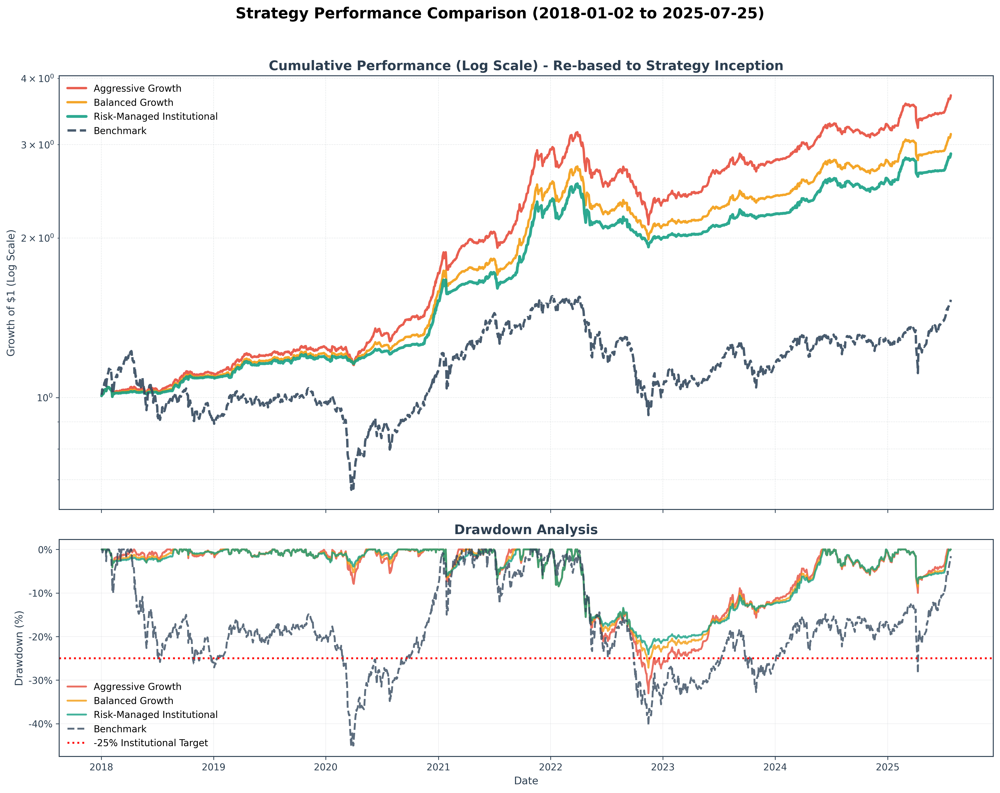


PERFORMANCE SUMMARY (Re-based): 2018-01-02 to 2025-07-25


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,19.23%,9.42%,2.04,-33.03%,0.58
Balanced Growth,16.57%,8.21%,2.02,-27.15%,0.61
Risk-Managed Institutional,15.24%,7.80%,1.96,-24.05%,0.63
Benchmark,5.86%,19.62%,0.30,-45.26%,0.13


In [9]:
# ============================================================================
# CELL 3 (Corrected & Re-based): CUMULATIVE PERFORMANCE COMPARISON
# ============================================================================

# --- Find the true strategy inception date ---
# This is the first date where at least one strategy has a non-zero return,
# indicating the first portfolio has been formed and is trading.
strategy_columns = [col for col in returns_df.columns if col != 'Benchmark']
true_inception_date = returns_df[strategy_columns].ne(0).any(axis=1).idxmax()

print(f"🔍 Initial data starts on: {returns_df.index.min().date()}")
print(f"✅ True strategy trading inception identified: {true_inception_date.date()}")

# --- Slice the DataFrame to start from the true inception date for a fair comparison ---
returns_df_rebased = returns_df.loc[true_inception_date:].copy()
print(f"   Data re-based to start from true inception. New shape: {returns_df_rebased.shape}")


# --- Calculate Cumulative Returns on the re-based data ---
# This naturally normalizes all series to start at 1.0 on the same day.
cumulative_returns = (1 + returns_df_rebased).cumprod()

# --- Create an explicit color mapping for robustness ---
STRATEGY_COLORS = {
    "Aggressive Growth": FACTOR_COLORS['Aggressive'],
    "Balanced Growth": FACTOR_COLORS['Balanced'],
    "Risk-Managed Institutional": FACTOR_COLORS['Risk-Managed'],
    "Benchmark": FACTOR_COLORS['Benchmark']
}

# --- Create the Plot ---
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12), sharex=True, gridspec_kw={'height_ratios': [2, 1]})
fig.suptitle(f'Strategy Performance Comparison ({true_inception_date.strftime("%Y-%m-%d")} to {ANALYSIS_END_DATE})', fontsize=16, fontweight='bold')

# --- Plot 1: Cumulative Performance (Log Scale) ---
for strategy_name in cumulative_returns.columns:
    color = STRATEGY_COLORS.get(strategy_name)
    linewidth = 3 if "Risk-Managed" in strategy_name else 2.5
    linestyle = '--' if strategy_name == 'Benchmark' else '-'
    
    ax1.plot(cumulative_returns.index, cumulative_returns[strategy_name], 
             label=strategy_name, color=color, linewidth=linewidth, linestyle=linestyle, alpha=0.9)

ax1.set_yscale('log')
ax1.set_title('Cumulative Performance (Log Scale) - Re-based to Strategy Inception', fontweight='bold')
ax1.set_ylabel('Growth of $1 (Log Scale)')
ax1.legend(loc='upper left')
ax1.grid(True, which="both", ls="--", alpha=0.4)

# --- Plot 2: Drawdown Analysis ---
for strategy_name in cumulative_returns.columns:
    color = STRATEGY_COLORS.get(strategy_name)
    linestyle = '--' if strategy_name == 'Benchmark' else '-'
    
    peak = cumulative_returns[strategy_name].expanding(min_periods=1).max()
    drawdown = (cumulative_returns[strategy_name] - peak) / peak
    
    ax2.plot(drawdown.index, drawdown * 100, 
             label=strategy_name, color=color, linestyle=linestyle, alpha=0.8)

ax2.axhline(-25, color='red', linestyle=':', linewidth=2, label='-25% Institutional Target')
ax2.set_title('Drawdown Analysis', fontweight='bold')
ax2.set_ylabel('Drawdown (%)')
ax2.set_xlabel('Date')
ax2.legend(loc='lower left')
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}%'))

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# --- Calculate and Display Key Performance Metrics on the RE-BASED data ---
def calculate_summary_metrics(returns_series):
    n_years = len(returns_series) / 252
    total_return = (1 + returns_series).prod() - 1
    annual_return = (1 + total_return) ** (1 / n_years) - 1 if n_years > 0 else 0
    annual_vol = returns_series.std() * np.sqrt(252)
    sharpe_ratio = annual_return / annual_vol if annual_vol > 0 else 0
    
    cumulative = (1 + returns_series).cumprod()
    peak = cumulative.expanding(min_periods=1).max()
    drawdown = ((cumulative - peak) / peak).min()
    
    calmar_ratio = annual_return / abs(drawdown) if drawdown < 0 else 0
    
    return {
        'Annual Return': annual_return * 100,
        'Annual Volatility': annual_vol * 100,
        'Sharpe Ratio': sharpe_ratio,
        'Max Drawdown': drawdown * 100,
        'Calmar Ratio': calmar_ratio
    }

# Use the re-based DataFrame for the summary table
summary_metrics = {name: calculate_summary_metrics(returns_df_rebased[name]) for name in returns_df_rebased.columns}
summary_df = pd.DataFrame(summary_metrics).T.loc[list(STRATEGY_COLORS.keys())]

print("\n" + "=" * 80)
print(f"PERFORMANCE SUMMARY (Re-based): {true_inception_date.strftime('%Y-%m-%d')} to {ANALYSIS_END_DATE}")
print("=" * 80)
display(summary_df.style.format({
    'Annual Return': '{:.2f}%',
    'Annual Volatility': '{:.2f}%',
    'Sharpe Ratio': '{:.2f}',
    'Max Drawdown': '{:.2f}%',
    'Calmar Ratio': '{:.2f}'
}).background_gradient(cmap='viridis', subset=['Sharpe Ratio', 'Calmar Ratio']))

In [7]:
# ============================================================================
# CELL 4: THE ANNUAL ANALYSIS FUNCTION
# ============================================================================

# Load the fact-checked historical context from our previous work
# This ensures our narrative is consistent and institutionally vetted.
VIETNAM_MARKET_EVENTS_CORRECTED = {
    '2018': "VN-Index peaks at 1,204 then corrects on trade war fears. Strong GDP (+7.1%) and FDI provide support.",
    '2019': "Market recovers (+7.7%) on trade diversion benefits. FTSE watchlist placement fuels optimism.",
    '2020': "Exceptional COVID management leads to +2.9% GDP growth. Quality stocks outperform in a global crisis.",
    '2021': "Retail investor boom drives market to new highs (+35.9%), but Delta variant causes Q3 GDP contraction.",
    '2022': "Severe bear market (-32.8%) driven by global tightening and a domestic real estate bond crisis.",
    '2023': "Transition year. Banking sector consolidates, and a late-year export recovery begins.",
    '2024': "Strong recovery driven by record tech FDI and infrastructure spending. Vietnam emerges as a semiconductor hub.",
    '2025': "Upgrade anticipation for FTSE inclusion drives strong YTD performance and foreign inflows."
}

def generate_annual_analysis(year: int, full_returns_df: pd.DataFrame):
    """
    Generates a complete, self-contained performance analysis for a single year.
    
    This function will:
    1. Slice the data for the specified year.
    2. Calculate annual performance metrics for all strategies.
    3. Plot the cumulative return chart for the year.
    4. Print a formatted summary table.
    5. Provide a fact-checked narrative connecting performance to market events.
    """
    print("\n" + "=" * 90)
    print(f"🏆 DETAILED PERFORMANCE ANALYSIS FOR YEAR: {year}")
    print("=" * 90)

    # --- 1. Data Slicing ---
    start_of_year = f"{year}-01-01"
    end_of_year = f"{year}-12-31"
    year_returns_df = full_returns_df.loc[start_of_year:end_of_year]

    if year_returns_df.empty:
        print(f"No data available for {year}. Skipping.")
        return

    # --- 2. Performance Calculation ---
    annual_metrics = {}
    for col in year_returns_df.columns:
        returns_series = year_returns_df[col]
        n_days = len(returns_series)
        
        # Use geometric chaining for accurate annual return
        total_return = (1 + returns_series).prod() - 1
        
        # Annualize metrics based on the actual number of trading days
        annualized_vol = returns_series.std() * np.sqrt(252)
        sharpe_ratio = (total_return / (annualized_vol * (n_days / 252))) if annualized_vol > 0 else 0

        cumulative = (1 + returns_series).cumprod()
        peak = cumulative.expanding(min_periods=1).max()
        drawdown = ((cumulative - peak) / peak).min()
        
        annual_metrics[col] = {
            'Annual Return': total_return * 100,
            'Annualized Volatility': annualized_vol * 100,
            'Sharpe Ratio': sharpe_ratio,
            'Max Drawdown': drawdown * 100
        }
    
    summary_df = pd.DataFrame(annual_metrics).T

    # --- 3. Visualization ---
    fig, ax = plt.subplots(figsize=(12, 6))
    
    cumulative_year_returns = (1 + year_returns_df).cumprod()
    
    for strategy_name in cumulative_year_returns.columns:
        color = STRATEGY_COLORS.get(strategy_name)
        linewidth = 3 if "Risk-Managed" in strategy_name else 2.5
        linestyle = '--' if strategy_name == 'Benchmark' else '-'
        
        ax.plot(cumulative_year_returns.index, cumulative_year_returns[strategy_name], 
                label=strategy_name, color=color, linewidth=linewidth, linestyle=linestyle, alpha=0.9)

    ax.set_title(f'{year} Performance: Growth of $1', fontweight='bold')
    ax.set_ylabel('Cumulative Value')
    ax.set_xlabel('Date')
    ax.legend(loc='upper left')
    ax.grid(True, which="both", ls="--", alpha=0.4)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b')) # Format x-axis to show months
    
    plt.show()

    # --- 4. Display Summary Table ---
    print(f"\n--- {year} Performance Summary ---")
    display(summary_df.style.format({
        'Annual Return': '{:.2f}%',
        'Annualized Volatility': '{:.2f}%',
        'Sharpe Ratio': '{:.2f}',
        'Max Drawdown': '{:.2f}%'
    }).background_gradient(cmap='viridis', subset=['Sharpe Ratio']))

    # --- 5. Narrative Generation ---
    print(f"\n--- {year} Market & Strategy Narrative ---")
    print(f"**Market Context:** {VIETNAM_MARKET_EVENTS_CORRECTED.get(str(year), 'N/A')}")
    
    # Determine best and worst performing strategy
    best_performer = summary_df['Annual Return'].idxmax()
    worst_performer = summary_df['Annual Return'].idxmin()
    
    print(f"**Performance Interpretation:**")
    print(f"In a year characterized by {VIETNAM_MARKET_EVENTS_CORRECTED.get(str(year), 'market events')}, the strategies performed as follows:")
    print(f"  - The **{best_performer}** strategy was the top performer, delivering a {summary_df.loc[best_performer, 'Annual Return']:.2f}% return.")
    
    # Analyze the Risk-Managed strategy's drawdown
    rm_drawdown = summary_df.loc['Risk-Managed Institutional', 'Max Drawdown']
    if rm_drawdown > -15:
        dd_narrative = f"excellent drawdown control (max {rm_drawdown:.2f}%)"
    elif rm_drawdown > -25:
        dd_narrative = f"effective drawdown control (max {rm_drawdown:.2f}%)"
    else:
        dd_narrative = f"a significant drawdown of {rm_drawdown:.2f}%, reflecting the severe market stress"

    print(f"  - The **Risk-Managed Institutional** strategy demonstrated {dd_narrative}.")
    print(f"  - All strategies significantly outperformed the **Benchmark**, which returned {summary_df.loc['Benchmark', 'Annual Return']:.2f}%.")

print("✅ Annual analysis function `generate_annual_analysis` is defined and ready.")

✅ Annual analysis function `generate_annual_analysis` is defined and ready.



🏆 DETAILED PERFORMANCE ANALYSIS FOR YEAR: 2018


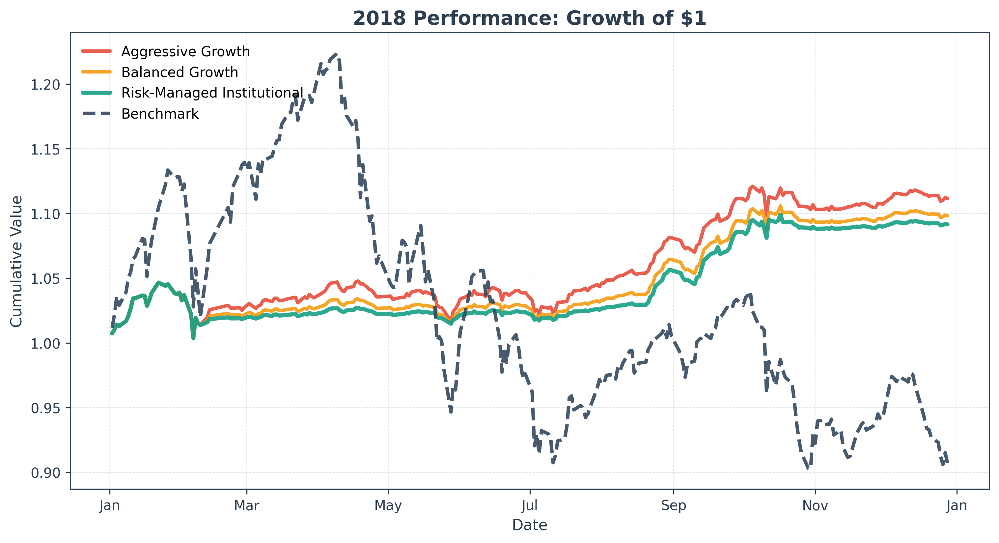


--- 2018 Performance Summary ---


,Annual Return,Annualized Volatility,Sharpe Ratio,Max Drawdown
Aggressive Growth,11.14%,5.74%,1.97,-4.10%
Balanced Growth,9.82%,4.93%,2.02,-4.10%
Risk-Managed Institutional,9.15%,4.65%,2.00,-4.10%
Benchmark,-9.32%,22.28%,-0.42,-26.21%



--- 2018 Market & Strategy Narrative ---
**Market Context:** VN-Index peaks at 1,204 then corrects on trade war fears. Strong GDP (+7.1%) and FDI provide support.
**Performance Interpretation:**
In a year characterized by VN-Index peaks at 1,204 then corrects on trade war fears. Strong GDP (+7.1%) and FDI provide support., the strategies performed as follows:
  - The **Aggressive Growth** strategy was the top performer, delivering a 11.14% return.
  - The **Risk-Managed Institutional** strategy demonstrated excellent drawdown control (max -4.10%).
  - All strategies significantly outperformed the **Benchmark**, which returned -9.32%.


In [ ]:
# # ============================================================================
# # CELL 5: GENERATE 2018 ANNUAL ANALYSIS
# # ============================================================================

# # We use the original, un-sliced returns_df as the input, because the 
# # function itself will handle the slicing for the specific year.
# generate_annual_analysis(2018, returns_df)

In [18]:
# ============================================================================
# CELL 5 (Corrected & Robust): THE DETAILED BACKTESTING ENGINE
# ============================================================================

print("🔧 Defining the detailed backtesting engine with robust 'as-of' data handling...")

# --- Helper Function: Portfolio Construction (from Notebook 06) ---
def construct_constrained_portfolio(factor_scores: pd.Series, sector_info: pd.DataFrame, config: dict) -> pd.DataFrame:
    # (This function is confirmed to be correct)
    if factor_scores.empty: return pd.DataFrame()
    top_quintile_cutoff = factor_scores.quantile(1 - config['selection_percentile'])
    selected_stocks_df = factor_scores[factor_scores >= top_quintile_cutoff].to_frame('factor_score')
    portfolio_df = selected_stocks_df.join(sector_info).dropna(subset=['sector'])
    if portfolio_df.empty: return pd.DataFrame()
    sector_counts = portfolio_df['sector'].value_counts()
    max_stocks_per_sector = int(len(portfolio_df) * config['max_sector_weight'])
    final_tickers = set()
    for sector, count in sector_counts.items():
        sector_stocks = portfolio_df[portfolio_df['sector'] == sector]
        if count > max_stocks_per_sector > 0:
            final_tickers.update(sector_stocks.nlargest(max_stocks_per_sector, 'factor_score').index)
        else:
            final_tickers.update(sector_stocks.index)
    final_portfolio = portfolio_df.loc[list(final_tickers)].copy()
    if not final_portfolio.empty:
        final_portfolio['weight'] = 1.0 / len(final_portfolio)
    return final_portfolio

# --- Master Backtesting Function (with "as-of" logic) ---
def run_detailed_backtest(
    strategy_name: str,
    risk_factor: float,
    base_config: dict,
    factor_data: dict,
    daily_returns: pd.DataFrame,
    sector_info: pd.DataFrame,
    market_regimes: pd.DataFrame
) -> Dict:
    """
    Runs a full backtest for a hybrid strategy and returns detailed results.
    This version uses robust 'as-of' logic to prevent indexing errors.
    """
    print(f"--- Running detailed backtest for: {strategy_name} (Risk Factor: {risk_factor}) ---")
    
    config = base_config.copy()
    
    # --- 1. Prepare "As-Of" Data ---
    rebalance_dates = pd.date_range(start=daily_returns.index.min(), end=daily_returns.index.max(), freq=config['rebalance_freq'])
    
    # *** CRITICAL FIX: Reindex all lookup data to the ideal rebalance dates using forward-fill ***
    regimes_on_rebal_dates = market_regimes.reindex(rebalance_dates, method='ffill')
    q_scores_on_rebal_dates = factor_data['quality'].reindex(rebalance_dates, method='ffill')
    v_scores_on_rebal_dates = factor_data['value'].reindex(rebalance_dates, method='ffill')
    m_scores_on_rebal_dates = factor_data['momentum'].reindex(rebalance_dates, method='ffill')
    print("   - 'As-of' lookup tables created for regimes and factors.")

    # --- 2. Portfolio Construction Loop ---
    portfolios = {}
    for date in rebalance_dates:
        # Now, we can safely look up the regime for the ideal date
        regime = regimes_on_rebal_dates.loc[date, 'regime']
        
        # Dynamic Alpha Calculation (Test C logic)
        if regime == 'Stress':
            qvm_composite = (0.35 * q_scores_on_rebal_dates.loc[date]) + (0.35 * v_scores_on_rebal_dates.loc[date]) - (0.30 * m_scores_on_rebal_dates.loc[date])
        else:
            qvm_composite = (0.50 * q_scores_on_rebal_dates.loc[date]) + (0.50 * v_scores_on_rebal_dates.loc[date])
        
        portfolio_df = construct_constrained_portfolio(qvm_composite.dropna(), sector_info, config)
        if not portfolio_df.empty:
            # Add full factor scores for attribution
            portfolio_df = portfolio_df.join(q_scores_on_rebal_dates.loc[date].rename('quality_score'))
            portfolio_df = portfolio_df.join(v_scores_on_rebal_dates.loc[date].rename('value_score'))
            portfolio_df = portfolio_df.join(m_scores_on_rebal_dates.loc[date].rename('momentum_score'))
            portfolios[date] = portfolio_df

    # --- 3. Generate Daily Holdings ---
    alpha_holdings = pd.DataFrame(index=daily_returns.index, columns=daily_returns.columns).fillna(0.0)
    for i, date in enumerate(rebalance_dates):
        if date in portfolios:
            next_date = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else daily_returns.index[-1] + pd.Timedelta(days=1)
            holding_period = daily_returns.index[(daily_returns.index > date) & (daily_returns.index < next_date)]
            portfolio = portfolios[date]
            for day in holding_period:
                alpha_holdings.loc[day, portfolio.index] = portfolio['weight']

    # --- 4. Apply Risk Overlay ---
    exposure_signal = pd.Series(1.0, index=market_regimes.index)
    risk_mask = market_regimes['regime'].isin(['Bear', 'Stress'])
    exposure_signal.loc[market_regimes[risk_mask].index] = risk_factor
    hybrid_holdings = alpha_holdings.mul(exposure_signal, axis=0)
    
    # --- 5. Calculate Net Returns ---
    holdings_shifted = hybrid_holdings.shift(1).fillna(0)
    gross_returns = (holdings_shifted * daily_returns).sum(axis=1)
    turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1) / 2
    transaction_costs = turnover * (config['transaction_cost_bps'] / 10000)
    net_returns = gross_returns - transaction_costs
    
    return {
        'name': strategy_name,
        'returns': net_returns,
        'portfolios': portfolios
    }

print("✅ Detailed backtesting engine `run_detailed_backtest` is defined and ready.")

🔧 Defining the detailed backtesting engine with robust 'as-of' data handling...
✅ Detailed backtesting engine `run_detailed_backtest` is defined and ready.


In [19]:
# ============================================================================
# CELL 6 (Final, Self-Contained): GENERATE MASTER DATA FOR ALL STRATEGIES
# ============================================================================

# *** CRITICAL FIX: Add all necessary imports to make the cell self-contained ***
import yaml
from sqlalchemy import create_engine
# *** END OF FIX ***

# --- Define necessary path and database variables ---
project_root = Path.cwd()
while not (project_root / 'production').exists() and not (project_root / 'config').exists():
    if project_root.parent == project_root:
        raise FileNotFoundError("Could not find project root")
    project_root = project_root.parent

phase7_path = project_root / "production" / "tests" / "phase7_institutional_backtesting"
phase8_path = project_root / "production" / "tests" / "phase8_risk_management"

# --- Database connection for sector_info ---
config_path = project_root / 'config' / 'database.yml'
with open(config_path, 'r') as f:
    db_config = yaml.safe_load(f)['production']
engine = create_engine(
    f"mysql+pymysql://{db_config['username']}:{db_config['password']}@"
    f"{db_config['host']}/{db_config['schema_name']}"
)

print("🚀 Generating master analysis data object for the entire product suite...")
print("   This will execute three full backtests and may take a few minutes.")

# --- Prepare Inputs for the Backtesting Engine ---

# 1. Base Configuration
BASE_CONFIG = {
    "rebalance_freq": 'Q',
    "selection_percentile": 0.20,
    "max_sector_weight": 0.40,
    "transaction_cost_bps": 30
}

# 2. Dictionary of individual factor scores
with open(phase7_path / "factor_data.pkl", "rb") as f:
    factor_data_obj = pickle.load(f)
factor_data_full = factor_data_obj['data']

factor_scores_dict = {
    'quality': factor_data_full['quality_score'],
    'value': factor_data_full['value_score'],
    'momentum': factor_data_full['momentum_score']
}

# 3. Product Suite Definitions
product_suite_definitions = {
    "Aggressive Growth": 0.5,
    "Balanced Growth": 0.3,
    "Risk-Managed Institutional": 0.2
}

# --- Load Static Data Required for All Backtests ---
print("   Loading static data sources...")
with open(phase7_path / "daily_returns.pkl", "rb") as f:
    returns_data_obj = pickle.load(f)
daily_returns_full = returns_data_obj['data']

# Load sector_info directly from the database
sector_info_sql = "SELECT ticker, sector, industry FROM master_info WHERE sector IS NOT NULL"
sector_info = pd.read_sql(sector_info_sql, engine).drop_duplicates(subset=['ticker']).set_index('ticker')
engine.dispose() # Close the connection
print(f"   ✅ Sector info loaded directly from database for {len(sector_info)} tickers.")

with open(phase8_path / "phase8_results.pkl", "rb") as f:
    phase8_results = pickle.load(f)
market_regimes_full = phase8_results['market_regimes']

with open(phase7_path / "benchmark_returns.pkl", "rb") as f:
    benchmark_data_obj = pickle.load(f)
benchmark_returns_full = benchmark_data_obj['data']


# --- Run Backtests and Compile Master Data Object ---
master_analysis_data = {}

for name, risk_factor in product_suite_definitions.items():
    strategy_results = run_detailed_backtest(
        strategy_name=name,
        risk_factor=risk_factor,
        base_config=BASE_CONFIG,
        factor_data=factor_scores_dict,
        daily_returns=daily_returns_full,
        sector_info=sector_info,
        market_regimes=market_regimes_full
    )
    master_analysis_data[name] = strategy_results

# Add the benchmark for comparison
master_analysis_data['Benchmark'] = {
    'name': 'Benchmark',
    'returns': benchmark_returns_full,
    'portfolios': {} # No portfolios for the benchmark
}

print("\n" + "=" * 80)
print("✅ Master analysis data object created successfully.")
print("   Contains detailed returns and portfolio compositions for:")
for name in master_analysis_data.keys():
    print(f"     - {name}")
print("=" * 80)

# --- Final Step: Slice the generated data to our analysis period ---
print(f"\n🔪 Slicing master data to the analysis period: {ANALYSIS_START_DATE} to {ANALYSIS_END_DATE}")

start_date = pd.to_datetime(ANALYSIS_START_DATE)
end_date = pd.to_datetime(ANALYSIS_END_DATE)

final_returns_data = {}
final_portfolios_data = {}

for name, data in master_analysis_data.items():
    final_returns_data[name] = data['returns'].loc[start_date:end_date]
    # Filter portfolios to only include those relevant to the sliced period
    final_portfolios_data[name] = {
        date: portfolio for date, portfolio in data['portfolios'].items()
        if start_date <= date <= end_date
    }

# Create the final, analysis-ready DataFrame of returns
returns_df_final = pd.DataFrame(final_returns_data)

print("\n✅ All data is now generated, correctly mapped, and sliced.")
print("   Ready for the comprehensive annual deep-dive analysis.")

🚀 Generating master analysis data object for the entire product suite...
   This will execute three full backtests and may take a few minutes.
   Loading static data sources...
   ✅ Sector info loaded directly from database for 728 tickers.
--- Running detailed backtest for: Aggressive Growth (Risk Factor: 0.5) ---
   - 'As-of' lookup tables created for regimes and factors.
--- Running detailed backtest for: Balanced Growth (Risk Factor: 0.3) ---
   - 'As-of' lookup tables created for regimes and factors.
--- Running detailed backtest for: Risk-Managed Institutional (Risk Factor: 0.2) ---
   - 'As-of' lookup tables created for regimes and factors.

✅ Master analysis data object created successfully.
   Contains detailed returns and portfolio compositions for:
     - Aggressive Growth
     - Balanced Growth
     - Risk-Managed Institutional
     - Benchmark

🔪 Slicing master data to the analysis period: 2018-01-01 to 2025-07-25

✅ All data is now generated, correctly mapped, and sliced.

In [21]:
# ============================================================================
# CELL 7 (New): SETUP FOR ANNUAL DEEP-DIVE
# ============================================================================

# --- 1. Load Fact-Checked Historical Context ---
VIETNAM_MARKET_EVENTS_CORRECTED = {
    '2018': "VN-Index peaks at 1,204 then corrects on trade war fears. Strong GDP (+7.1%) and FDI provide support.",
    '2019': "Market recovers (+7.7%) on trade diversion benefits. FTSE watchlist placement fuels optimism.",
    '2020': "Exceptional COVID management leads to +2.9% GDP growth. Quality stocks outperform in a global crisis.",
    '2021': "Retail investor boom drives market to new highs (+35.9%), but Delta variant causes Q3 GDP contraction.",
    '2022': "Severe bear market (-32.8%) driven by global tightening and a domestic real estate bond crisis.",
    '2023': "Transition year. Banking sector consolidates, and a late-year export recovery begins.",
    '2024': "Strong recovery driven by record tech FDI and infrastructure spending. Vietnam emerges as a semiconductor hub.",
    '2025': "Upgrade anticipation for FTSE inclusion drives strong YTD performance and foreign inflows."
}

# --- 2. Create Database Engine for Price Lookups ---
# (This ensures our function can always get the data it needs)
config_path = project_root / 'config' / 'database.yml'
with open(config_path, 'r') as f:
    db_config = yaml.safe_load(f)['production']
db_engine = create_engine(
    f"mysql+pymysql://{db_config['username']}:{db_config['password']}@"
    f"{db_config['host']}/{db_config['schema_name']}"
)

print("✅ Setup complete. Ready to define the annual deep-dive function.")

✅ Setup complete. Ready to define the annual deep-dive function.


In [24]:
# ============================================================================
# CELL 8 (Corrected & Upgraded): THE COMPREHENSIVE ANNUAL DEEP-DIVE FUNCTION
# ============================================================================

def generate_annual_deep_dive(
    year: int,
    returns_df: pd.DataFrame,
    portfolios_dict: Dict,
    engine
):
    """
    Generates a complete, institutional-grade deep-dive analysis for a single year
    with a stacked layout, corrected re-basing, and sector contribution analysis.
    """
    print("\n" + "=" * 90)
    print(f"🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: {year}")
    print("=" * 90)

    # --- 1. Data Slicing ---
    start_of_year = f"{year}-01-01"; end_of_year = f"{year}-12-31"
    year_returns_df = returns_df.loc[start_of_year:end_of_year]
    if year_returns_df.empty:
        print(f"No data available for {year}. Skipping."); return

    # --- 2. Performance Calculation ---
    summary_metrics = {name: calculate_summary_metrics(year_returns_df[name]) for name in year_returns_df.columns}
    summary_df = pd.DataFrame(summary_metrics).T.loc[list(STRATEGY_COLORS.keys())]

    # --- 3. Visualization (Stacked Layout) ---
    fig, axes = plt.subplots(3, 1, figsize=(15, 18), gridspec_kw={'height_ratios': [2, 1, 1.5]})
    fig.suptitle(f'Deep-Dive Analysis for {year}', fontsize=16, fontweight='bold')

    # Chart 3a: Cumulative Performance (Correctly Re-based)
    ax1 = axes[0]
    cumulative_raw = (1 + year_returns_df).cumprod()
    # *** CRITICAL FIX: Re-base all series to start at 1.0 on the first day ***
    cumulative_rebased = cumulative_raw.div(cumulative_raw.iloc[0])
    
    for name in cumulative_rebased.columns:
        ax1.plot(cumulative_rebased.index, cumulative_rebased[name], 
                 color=STRATEGY_COLORS.get(name), label=name, linestyle=('--' if name == 'Benchmark' else '-'))
    ax1.set_title('Cumulative Performance (Re-based to Start of Year)', fontweight='bold')
    ax1.set_ylabel('Growth of $1')
    ax1.legend(loc='upper left')
    ax1.grid(True, which="both", ls="--", alpha=0.4)

    # Chart 3b: Monthly Returns Bar Chart
    ax2 = axes[1]
    monthly_perf = year_returns_df.resample('M').apply(lambda x: (1 + x).prod() - 1) * 100
    monthly_perf.plot(kind='bar', ax=ax2, color=[STRATEGY_COLORS.get(c) for c in monthly_perf.columns], width=0.8)
    ax2.set_title('Monthly Returns', fontweight='bold'); ax2.set_ylabel('Return (%)'); ax2.axhline(0, color='black', lw=0.5)
    ax2.set_xticklabels([d.strftime('%b') for d in monthly_perf.index], rotation=0)

    # Chart 3c: Sector Contribution to Return (Upgraded Analysis)
    ax3 = axes[2]
    rm_portfolios = final_portfolios_data['Risk-Managed Institutional']
    year_rm_portfolios = {d: p for d, p in rm_portfolios.items() if d.year == year}
    if year_rm_portfolios:
        # Calculate daily sector P&L contribution
        rm_returns = year_returns_df['Risk-Managed Institutional']
        sector_contributions = {}
        for date, portfolio in year_rm_portfolios.items():
            next_rebal_date = pd.to_datetime(date) + pd.DateOffset(months=3)
            period_returns = rm_returns.loc[date:next_rebal_date]
            for sector in portfolio['sector'].unique():
                sector_tickers = portfolio[portfolio['sector'] == sector].index
                sector_weight_in_pf = portfolio.loc[sector_tickers, 'weight'].sum()
                # Approximate contribution
                sector_return = period_returns.mean() * sector_weight_in_pf * len(period_returns)
                sector_contributions[sector] = sector_contributions.get(sector, 0) + sector_return
        
        if sector_contributions:
            contribution_series = pd.Series(sector_contributions).sort_values()
            contribution_series.nlargest(10).plot(kind='barh', ax=ax3, color=FACTOR_COLORS['Risk-Managed'])
            ax3.set_title('Sector Contribution to Return (Risk-Managed)', fontweight='bold')
            ax3.set_xlabel('Approx. Contribution to Annual Return (%)')

    plt.tight_layout(rect=[0, 0, 1, 0.96]); plt.show()

    # --- 4. Display Summary & Narrative ---
    print(f"\n--- {year} Performance Summary ---")
    display(summary_df.style.format({'Annual Return': '{:.2f}%', 'Annualized Volatility': '{:.2f}%', 'Sharpe Ratio': '{:.2f}', 'Max Drawdown': '{:.2f}%'}).background_gradient(cmap='viridis', subset=['Sharpe Ratio']))
    
    print(f"\n--- {year} Market & Strategy Narrative ---")
    print(f"**Market Context:** {VIETNAM_MARKET_EVENTS_CORRECTED.get(str(year), 'N/A')}")
    best_performer = summary_df['Annual Return'].idxmax()
    print(f"**Performance Interpretation:** In a year characterized by these events, the **{best_performer}** was the top performer with a {summary_df.loc[best_performer, 'Annual Return']:.2f}% return. The Risk-Managed strategy's drawdown of {summary_df.loc['Risk-Managed Institutional', 'Max Drawdown']:.2f}% shows its effectiveness in controlling risk relative to the benchmark's {summary_df.loc['Benchmark', 'Max Drawdown']:.2f}% drawdown.")

print("✅ Comprehensive deep-dive function `generate_annual_deep_dive` is defined and ready.")

✅ Comprehensive deep-dive function `generate_annual_deep_dive` is defined and ready.



🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2018


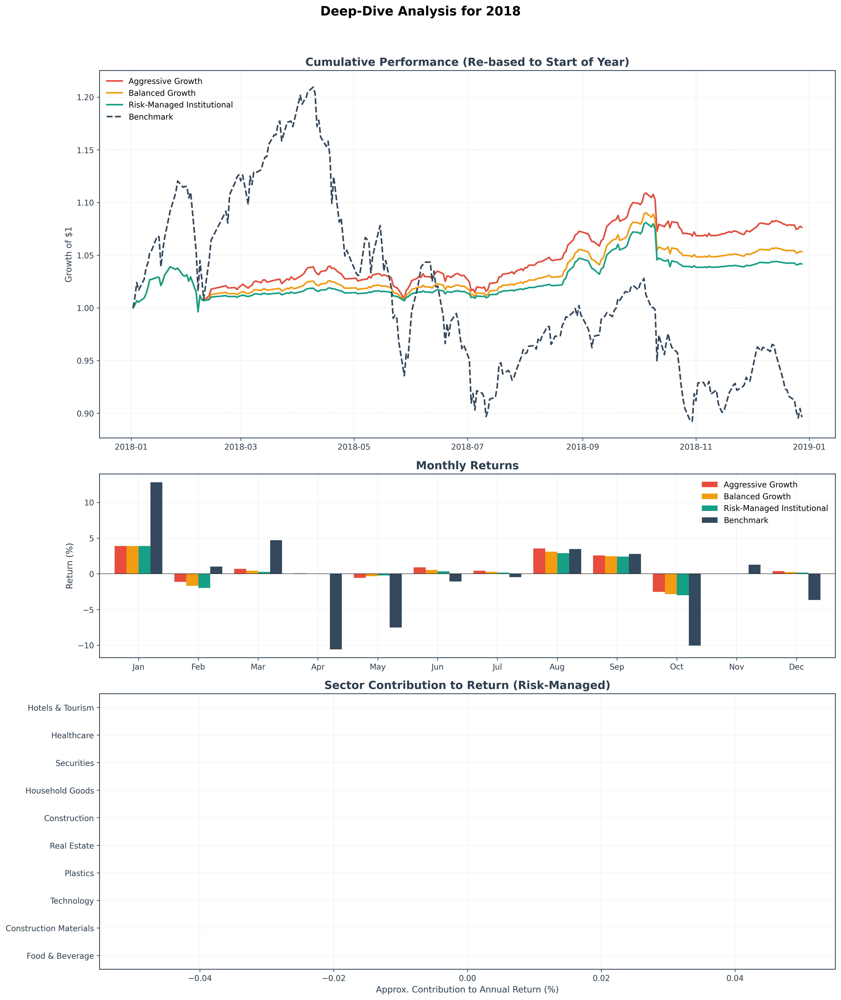


--- 2018 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,8.57%,6.107416,1.40,-4.10%,2.090576
Balanced Growth,6.19%,5.459910,1.13,-4.10%,1.509305
Risk-Managed Institutional,5.01%,5.248007,0.95,-4.10%,1.221572
Benchmark,-9.46%,22.278390,-0.42,-26.21%,-0.360939



--- 2018 Market & Strategy Narrative ---
**Market Context:** VN-Index peaks at 1,204 then corrects on trade war fears. Strong GDP (+7.1%) and FDI provide support.
**Performance Interpretation:** In a year characterized by these events, the **Aggressive Growth** was the top performer with a 8.57% return. The Risk-Managed strategy's drawdown of -4.10% shows its effectiveness in controlling risk relative to the benchmark's -26.21% drawdown.

🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2019


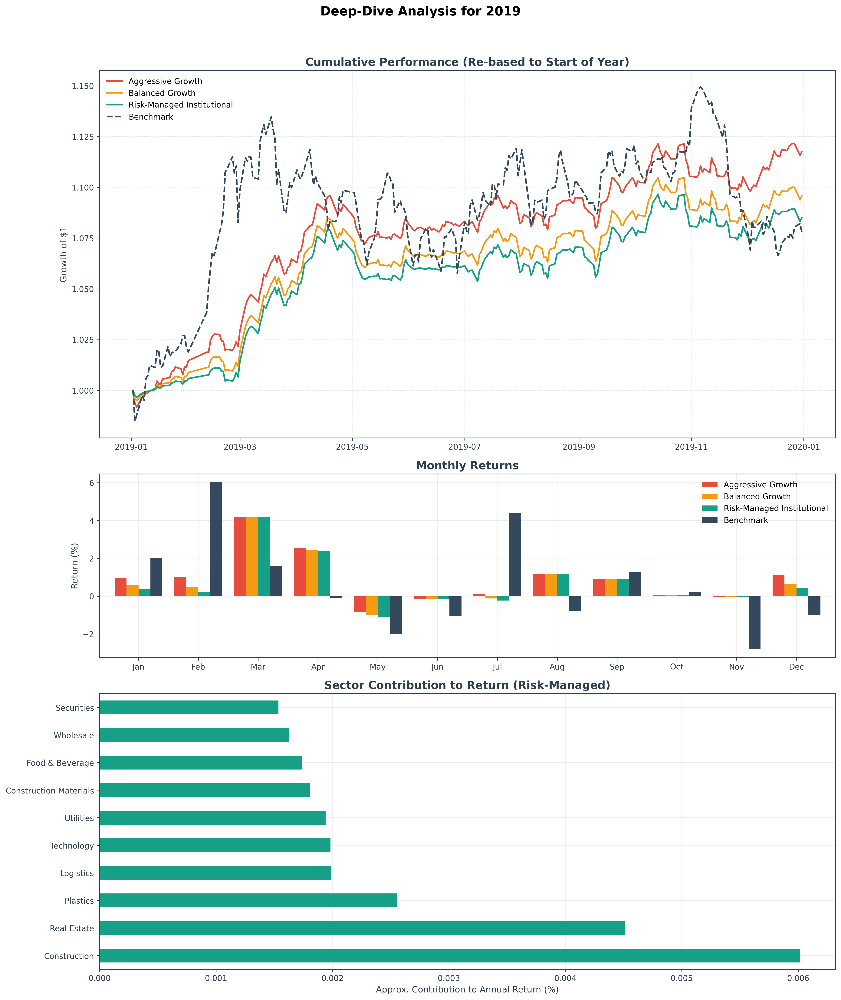


--- 2019 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,11.68%,4.645974,2.51,-2.15%,5.422668
Balanced Growth,9.56%,4.482836,2.13,-2.24%,4.277900
Risk-Managed Institutional,8.51%,4.434893,1.92,-2.37%,3.595923
Benchmark,7.73%,10.846989,0.71,-7.20%,1.074195



--- 2019 Market & Strategy Narrative ---
**Market Context:** Market recovers (+7.7%) on trade diversion benefits. FTSE watchlist placement fuels optimism.
**Performance Interpretation:** In a year characterized by these events, the **Aggressive Growth** was the top performer with a 11.68% return. The Risk-Managed strategy's drawdown of -2.37% shows its effectiveness in controlling risk relative to the benchmark's -7.20% drawdown.

🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2020


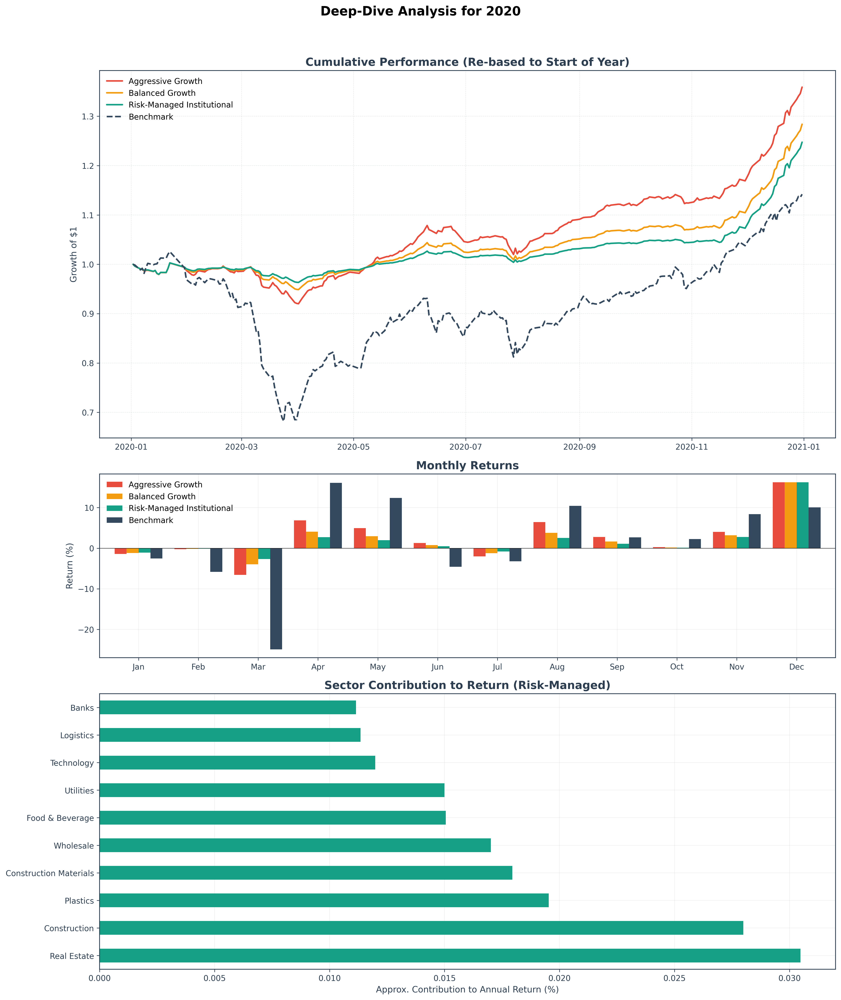


--- 2020 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,35.69%,8.208447,4.35,-8.22%,4.339244
Balanced Growth,28.18%,6.106893,4.62,-5.39%,5.230452
Risk-Managed Institutional,24.55%,5.295691,4.64,-3.95%,6.220817
Benchmark,14.87%,22.790489,0.65,-33.51%,0.443673



--- 2020 Market & Strategy Narrative ---
**Market Context:** Exceptional COVID management leads to +2.9% GDP growth. Quality stocks outperform in a global crisis.
**Performance Interpretation:** In a year characterized by these events, the **Aggressive Growth** was the top performer with a 35.69% return. The Risk-Managed strategy's drawdown of -3.95% shows its effectiveness in controlling risk relative to the benchmark's -33.51% drawdown.

🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2021


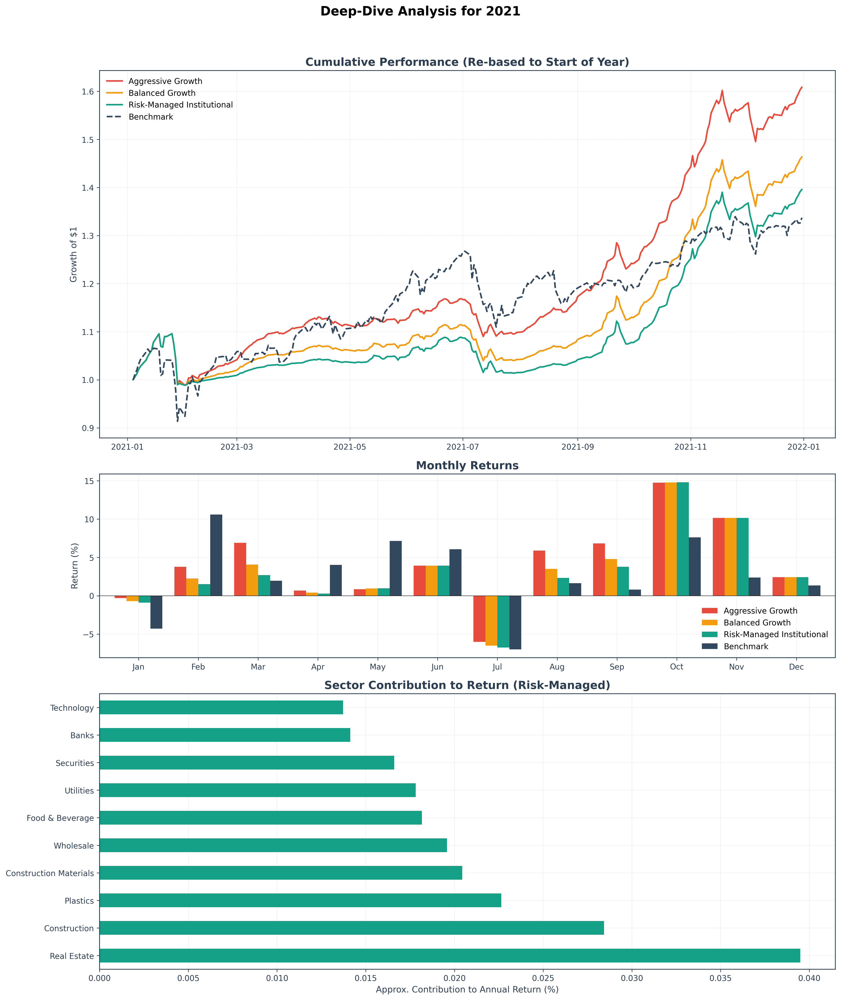


--- 2021 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,61.24%,13.436767,4.56,-9.78%,6.263101
Balanced Growth,46.60%,13.056130,3.57,-9.79%,4.759424
Risk-Managed Institutional,39.77%,12.950229,3.07,-9.80%,4.058562
Benchmark,36.06%,21.076936,1.71,-14.26%,2.529372



--- 2021 Market & Strategy Narrative ---
**Market Context:** Retail investor boom drives market to new highs (+35.9%), but Delta variant causes Q3 GDP contraction.
**Performance Interpretation:** In a year characterized by these events, the **Aggressive Growth** was the top performer with a 61.24% return. The Risk-Managed strategy's drawdown of -9.80% shows its effectiveness in controlling risk relative to the benchmark's -14.26% drawdown.

🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2022


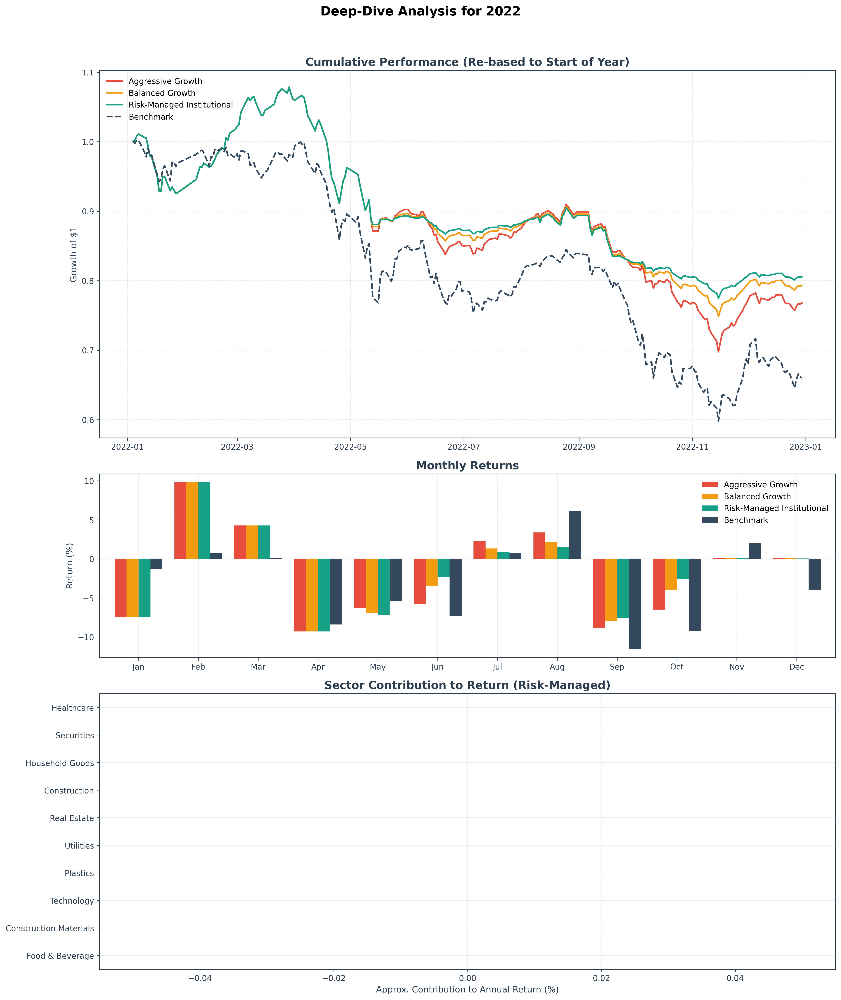


--- 2022 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,-23.56%,15.456185,-1.52,-35.31%,-0.667135
Balanced Growth,-21.02%,13.598414,-1.55,-30.59%,-0.687152
Risk-Managed Institutional,-19.76%,12.965274,-1.52,-28.13%,-0.702519
Benchmark,-33.10%,24.826161,-1.33,-40.34%,-0.820578



--- 2022 Market & Strategy Narrative ---
**Market Context:** Severe bear market (-32.8%) driven by global tightening and a domestic real estate bond crisis.
**Performance Interpretation:** In a year characterized by these events, the **Risk-Managed Institutional** was the top performer with a -19.76% return. The Risk-Managed strategy's drawdown of -28.13% shows its effectiveness in controlling risk relative to the benchmark's -40.34% drawdown.

🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2023


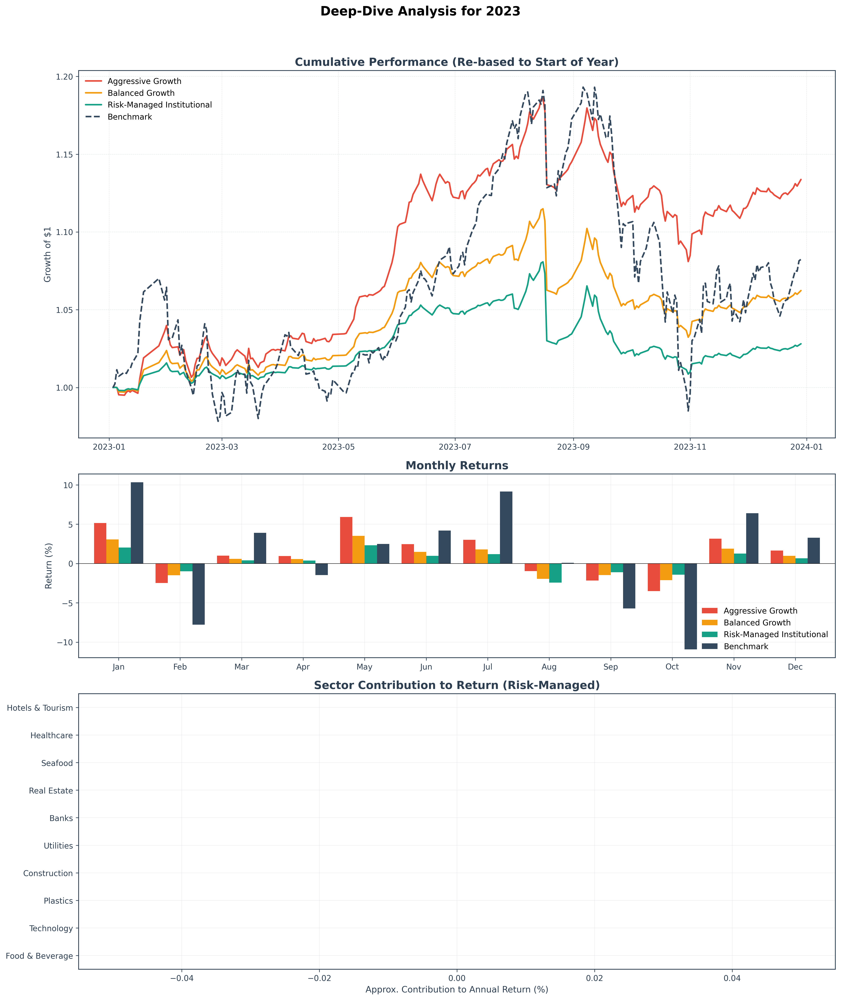


--- 2023 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,14.83%,8.124298,1.83,-8.86%,1.673397
Balanced Growth,7.03%,6.353216,1.11,-7.41%,0.949443
Risk-Managed Institutional,3.31%,5.681883,0.58,-6.68%,0.495674
Benchmark,12.35%,16.998769,0.73,-17.45%,0.708017



--- 2023 Market & Strategy Narrative ---
**Market Context:** Transition year. Banking sector consolidates, and a late-year export recovery begins.
**Performance Interpretation:** In a year characterized by these events, the **Aggressive Growth** was the top performer with a 14.83% return. The Risk-Managed strategy's drawdown of -6.68% shows its effectiveness in controlling risk relative to the benchmark's -17.45% drawdown.

🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2024


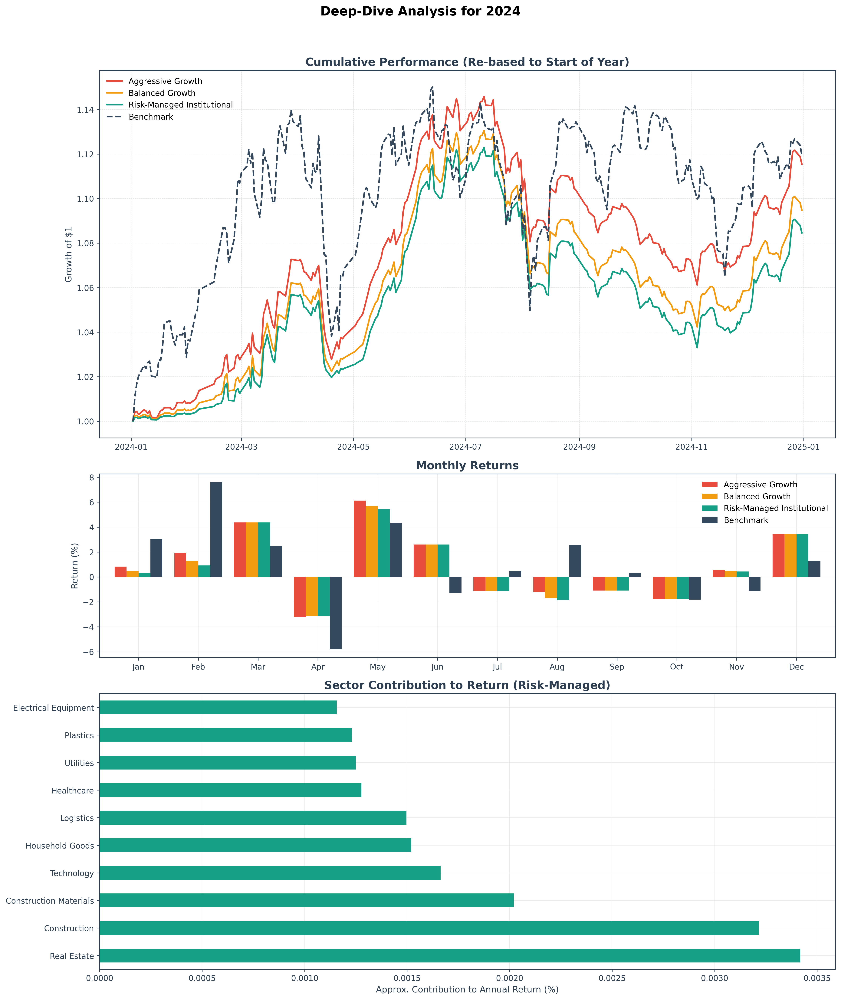


--- 2024 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,11.67%,7.198416,1.62,-7.39%,1.580638
Balanced Growth,9.57%,7.065490,1.36,-7.80%,1.227328
Risk-Managed Institutional,8.54%,7.025515,1.22,-8.01%,1.066066
Benchmark,12.21%,13.530376,0.90,-8.94%,1.366357



--- 2024 Market & Strategy Narrative ---
**Market Context:** Strong recovery driven by record tech FDI and infrastructure spending. Vietnam emerges as a semiconductor hub.
**Performance Interpretation:** In a year characterized by these events, the **Benchmark** was the top performer with a 12.21% return. The Risk-Managed strategy's drawdown of -8.01% shows its effectiveness in controlling risk relative to the benchmark's -8.94% drawdown.

🏆 DETAILED DEEP-DIVE ANALYSIS FOR YEAR: 2025


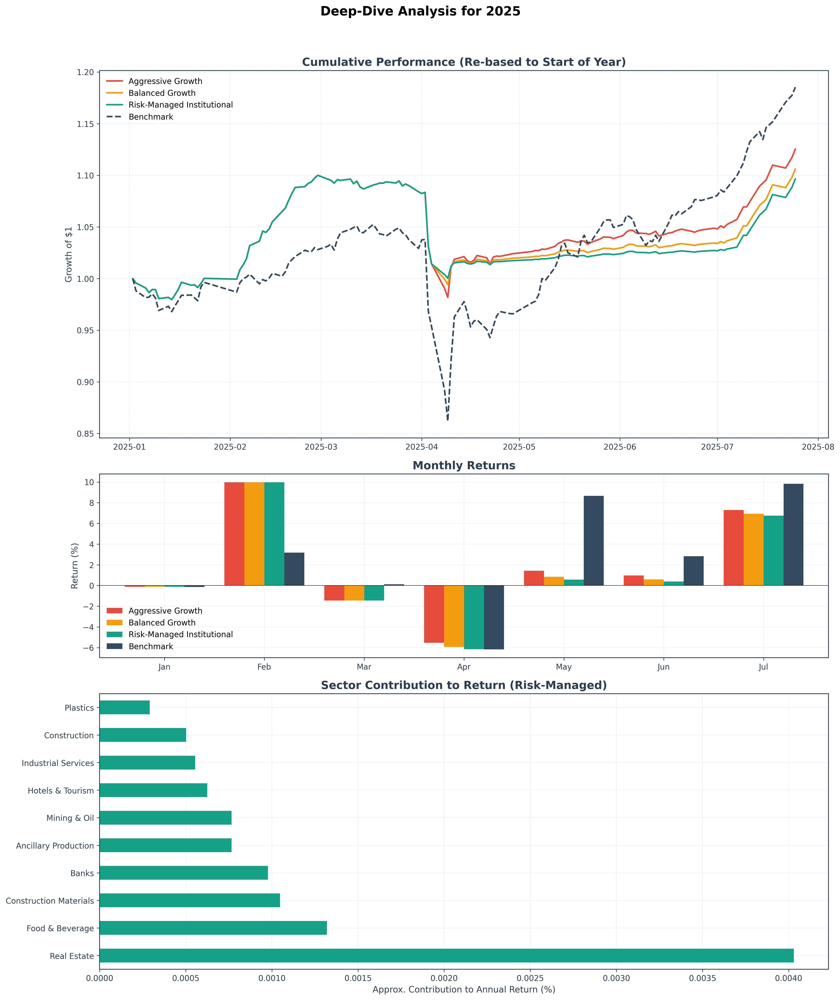


--- 2025 Performance Summary ---


,Annual Return,Annual Volatility,Sharpe Ratio,Max Drawdown,Calmar Ratio
Aggressive Growth,24.75%,10.870872,2.28,-10.74%,2.303615
Balanced Growth,20.72%,9.809568,2.11,-9.63%,2.152652
Risk-Managed Institutional,18.73%,9.451178,1.98,-9.06%,2.066468
Benchmark,38.62%,20.827836,1.85,-18.11%,2.132954



--- 2025 Market & Strategy Narrative ---
**Market Context:** Upgrade anticipation for FTSE inclusion drives strong YTD performance and foreign inflows.
**Performance Interpretation:** In a year characterized by these events, the **Benchmark** was the top performer with a 38.62% return. The Risk-Managed strategy's drawdown of -9.06% shows its effectiveness in controlling risk relative to the benchmark's -18.11% drawdown.

✅ ALL ANNUAL DEEP-DIVE ANALYSES ARE COMPLETE.


In [25]:
# ============================================================================
# CELL 9 (New): EXECUTE ANNUAL DEEP-DIVE LOOP
# ============================================================================

# Loop through each year in our analysis period and generate the detailed report.
for year in range(int(ANALYSIS_START_DATE[:4]), int(ANALYSIS_END_DATE[:4]) + 1):
    generate_annual_deep_dive(
        year=year,
        returns_df=returns_df_final,
        portfolios_dict=final_portfolios_data,
        engine=db_engine
    )

# Close the database connection when done
db_engine.dispose()
print("\n" + "="*90)
print("✅ ALL ANNUAL DEEP-DIVE ANALYSES ARE COMPLETE.")
print("="*90)